<a href="https://colab.research.google.com/github/mostafaramadann/League-of-YOLO/blob/main/LeagueYOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Loading data and Modules**

---



In [1]:
!pip install tfa-nightly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 29.9 MB/s eta 0:00:00


In [2]:
import os
import cv2
import tensorflow_addons as tfa
import math
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from tqdm.notebook import trange, tqdm
import gc

/usr/local/lib/python3.9/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.9.0 and strictly below 2.12.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.12.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


In [3]:
if not os.path.isfile('mid.names'):
  !wget -O data.zip "https://msaedueg-my.sharepoint.com/:u:/g/personal/mostafa_ramadan1_msa_edu_eg/EXtR0nvmucdAsudR0Vr3dxgBvWq_98sW6JqdTnjVwR5XEw?e=QRAMYm&download=1"
  !unzip data.zip
  !rm -f data.zip
  !rm -rf sample_data

Streaming output truncated to the last 5000 lines.
  inflating: mid_dataset/labels/coloured_noised_yorick_1_00042.txt  
  inflating: mid_dataset/labels/coloured_noised_yorick_1_00043.txt  
  inflating: mid_dataset/labels/coloured_noised_yorick_1_00044.txt  
  inflating: mid_dataset/labels/coloured_noised_yorick_1_00045.txt  
  inflating: mid_dataset/labels/coloured_noised_yorick_1_00046.txt  
  inflating: mid_dataset/labels/coloured_noised_yorick_1_00047.txt  
  inflating: mid_dataset/labels/coloured_noised_yorick_1_00048.txt  
  inflating: mid_dataset/labels/coloured_noised_yorick_1_00049.txt  
  inflating: mid_dataset/labels/coloured_noised_yorick_1_00050.txt  
  inflating: mid_dataset/labels/coloured_noised_yorick_1_00051.txt  
  inflating: mid_dataset/labels/coloured_noised_yorick_1_00052.txt  
  inflating: mid_dataset/labels/coloured_noised_yorick_1_00053.txt  
  inflating: mid_dataset/labels/coloured_noised_yorick_1_00054.txt  
  inflating: mid_dataset/labels/coloured_noised_yori

In [4]:
epochs = 40
batch_size = 16
training_perc = 0.1
champions = ['veigar','diana','vladimir','ryze','ekko','irelia',
             'master_yi','nocturne','pantheon','yorick']

In [5]:
base_path = os.path.join(os.getcwd(),'mid_dataset')
images_path = os.path.join(base_path,'images')
labels_path = os.path.join(base_path,'labels')

image_files = os.listdir(images_path)
label_files = os.listdir(labels_path)

image_files = sorted(image_files)
label_files = sorted(label_files)

# image_files,label_files = shuffle(image_files,label_files)


split = int(len(image_files)*training_perc)
train_image_files = image_files[:split]
train_label_files = label_files[:split]


test_image_files = image_files[split:]
test_label_files = label_files[split:]
print(f"number of train images are {len(train_image_files)}")
# print(len(train_label_files))

print(f"number of test images are {len(test_image_files)}")
# print(len(test_label_files))


number of train images are 720
number of test images are 6480


# **Model**

---



In [6]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, MaxPooling2D, Dense, Dropout, Input, Flatten

In [7]:
class ConvMax(tf.keras.Model):

  def __init__(self,filters,kernel_size,strides=(1,1),
               activation="relu"):
    super(ConvMax, self).__init__()
    self.conv = Conv2D(filters,kernel_size=kernel_size,activation=activation,padding="SAME",strides=strides)
    self.bn = BatchNormalization(center=True,scale=True,trainable=True)
    self.pool = MaxPooling2D()
    
  def call(self,input_tensor):
    x = self.conv(input_tensor)
    x = self.bn(x)
    x = self.pool(x)
    return x

class ConvBatch(tf.keras.Model):

  def __init__(self,filters,kernel_size,strides=(1,1),padding="same",norm=False\
               ,activation="relu"):
               
    super(ConvBatch, self).__init__()
    self.conv = Conv2D(filters,kernel_size=kernel_size,activation=activation,padding=padding,\
                       strides=strides)
    self.norm = norm
    if self.norm:
      self.bn = BatchNormalization(center=True,scale=True,trainable=True)

  def call(self,input_tensor):
    x = self.conv(input_tensor)
    if self.norm:
      x = self.bn(x)
    return x

In [8]:
def relu_scaler(scale):
  def srelu(x):
    y = tf.divide(x,scale)
    return tf.maximum(0.,y)
  return srelu

In [10]:
def yolo(input=Input(shape=(448,448,3))):

  x = ConvMax(64,(7,7),strides=(2,2))(input)

  x = ConvMax(192,(3,3))(x)
  x = ConvBatch(128,(1,1))(x)
  x = ConvBatch(256,(3,3))(x)
  x = ConvBatch(256,(1,1))(x)
  x = ConvMax(512,(3,3))(x)

  x = ConvBatch(128,(1,1))(x)
  x = ConvBatch(256,(3,3))(x)

  x = ConvBatch(256,(1,1))(x)
  x = ConvMax(512,(3,3))(x)

  x = ConvBatch(256,(1,1))(x)
  x = ConvBatch(512,(3,3))(x)

  x = ConvBatch(256,(3,3))(x)

  x = ConvBatch(512,(3,3),strides=(2,2))(x)

  x = ConvBatch(512,(3,3))(x)
  
  x = ConvBatch(512,(3,3))(x)
  
  x = Flatten()(x)
  x = Dense(128)(x)
  x = Dense(2048)(x)
  x1 = Dense(7*7*1,activation="sigmoid")(x)
  x2 = Dense(7*7*4,activation="sigmoid")(x)
  x3 = Dense(7*7*10,activation="softmax")(x)

  x1 = tf.keras.layers.Reshape((7,7,1))(x1)
  x2 = tf.keras.layers.Reshape((7,7,4))(x2)
  x3 = tf.keras.layers.Reshape((7,7,10))(x3)

  x = tf.keras.layers.concatenate([x1,x2,x3])

  return tf.keras.Model(inputs=[input],outputs=[x])


In [11]:
model = yolo()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 448, 448, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv_max (ConvMax)             (None, 112, 112, 64  9728        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 conv_max_1 (ConvMax)           (None, 56, 56, 192)  111552      ['conv_max[0][0]']               
                                                                                              

#**Preprocessing**

---



In [12]:
def thresh(img,value):
  channels = []
  
  for i in range(3):
    c = (img[:,:,i].numpy().copy()*255).astype("int32")
    c[c>=value] = np.mean(img)
    channels.append(np.expand_dims(c,axis=-1))
    
  return np.concatenate(channels,axis=-1)/255.

In [13]:
def gaussian_blur(img):
  return cv2.GaussianBlur(img.numpy().copy(),(3,3),1.5)

def translation_avg(img):
  factor = 1
  imy = tfa.image.translate(img,[0,factor])
  imx = tfa.image.translate(img,[factor,0])
  imny = tfa.image.translate(img,[0,-factor])
  imnx = tfa.image.translate(img,[-factor,0])
  imnxy = tfa.image.translate(img,[-factor,-factor])
  imxy = tfa.image.translate(img,[factor,factor])
  return (imny+imy+imx+imnx+imxy+imnxy+img)/7

def blur(img):
  img1 = cv2.medianBlur(img.numpy().copy(),3)
  kernel = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])
  image_sharp = cv2.medianBlur(cv2.filter2D(src=img1, ddepth=-1, kernel=kernel),3)
  return image_sharp
#cv2.medianBlur

In [14]:
def create_label_tensor(labels):
  label_tensors = []
  
  for i in range(len(labels)):
    tensor = np.zeros((7,7,15),dtype=np.float32)
    midx, midy, w, h = labels[i,1:5]

    r = int((midy-(h/2))*7)
    c = int((midx-(w/2))*7)

    tensor[r,c] = np.array(labels[i],dtype=np.float32)
    label_tensors.append(tensor)
  
  return np.array(label_tensors,dtype=np.float32)

In [15]:
def batch_generator(batch_size,image_files,label_files):
  image_files,label_files = shuffle(image_files,label_files)
  images = []
  labels = []
  
  for i,data in enumerate(zip(image_files,label_files)):

    if i%batch_size == 0 and i!=0:
      l_tensor = create_label_tensor(np.array(labels,dtype=np.float32))
      yield [tf.concat(images,axis=0),l_tensor]
      images = []
      labels = []

    image_file, label_file = data
    image = tf.io.decode_jpeg(tf.io.read_file(os.path.join(images_path,image_file)))
    if "noised" in image_file.split("_"):
      image = blur(image)

    image = tf.math.divide(image,255)
    image = tf.cast(tf.image.resize(tf.expand_dims(image,axis=0),[448,448]),tf.float32)

    with open(os.path.join(labels_path,label_file)) as file:
        lines = file.readlines()
        category,midx,midy,w,h = lines[0].split(" ")
        categories = [0 for i in range(10)]
        categories[int(category)] = 1
        depth = [1,float(midx),float(midy),float(w),float(h)]
        depth.extend(categories)

        images.append(image)
        labels.append(np.array(depth,dtype=np.float32))

In [17]:
def visualize(img,pred,thresh):
  champions = ['veigar','diana','vladimir','ryze','ekko','irelia',
              'master_yi','nocturne','pantheon','yorick']
              
  font = cv2.FONT_HERSHEY_SIMPLEX
  fmap = pred.reshape((-1,49,15))
  im = img[0].numpy().copy()
  i = np.argmax(fmap[0,:,0])
  c_hat = fmap[0,i,0] # (B,49)
  x_hat = fmap[0,i,1] 
  y_hat = fmap[0,i,2]
  w_hat = fmap[0,i,3]
  h_hat = fmap[0,i,4]
  index = np.argmax(fmap[0,i,5:])

  if c_hat>0.5:
    x_min = int((x_hat-(w_hat/2))*448)
    y_min = int((y_hat-(h_hat/2))*448)
    x_max = int((x_hat+(w_hat/2))*448)
    y_max = int((y_hat+(h_hat/2))*448)

    p1 = (x_min,y_min)
    p2 = (x_max,y_max)
    im1 = cv2.rectangle(im.copy(),p1,p2,(255,0,0),2)
    im2 = cv2.putText(im1, str(champions[index]), (p1[0]-2,p1[1]-5), font, 
                    0.65, (0, 1, 0),2, cv2.LINE_AA)

    plt.figure(figsize=(7,7))
    plt.imshow(im1)
    plt.show()

In [18]:
images, tensors = next(batch_generator(16,train_image_files,train_label_files))
print(np.mean(images))
print(np.std(images))
print(images.shape)

0.1838811
0.1719048
(16, 448, 448, 3)


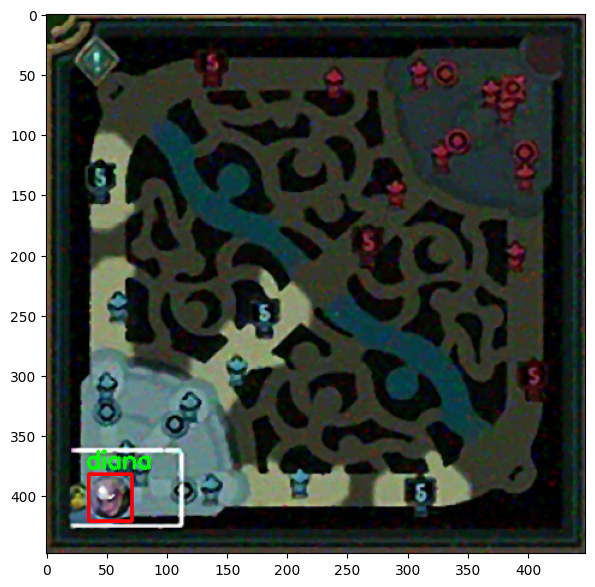

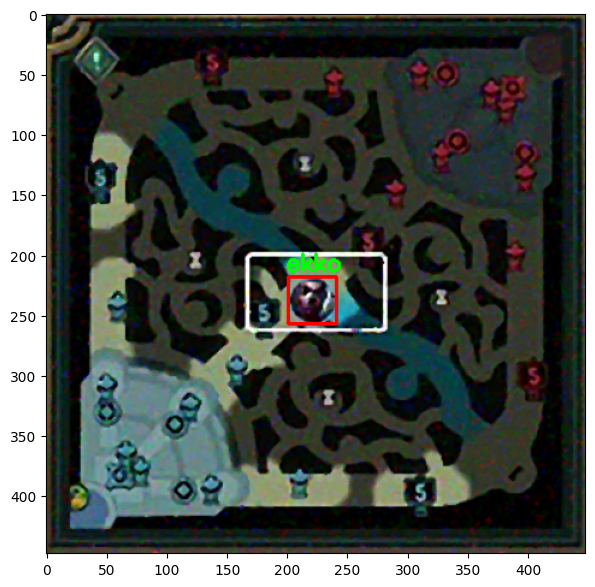

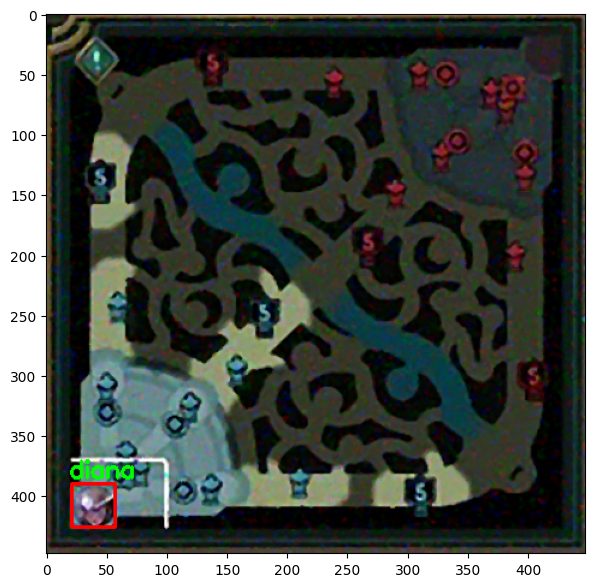

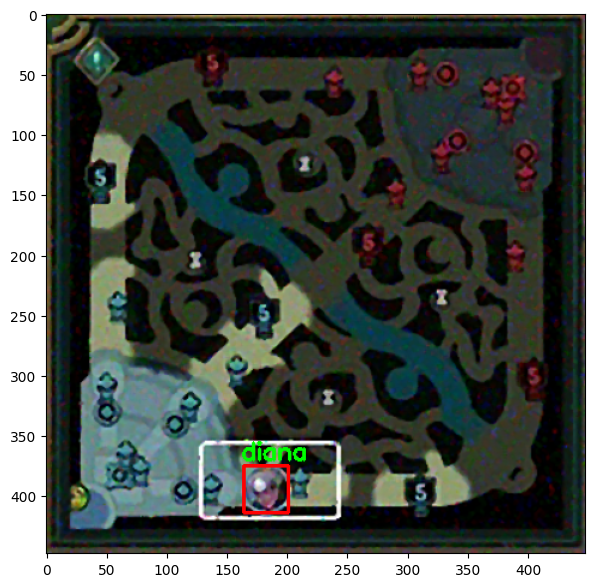

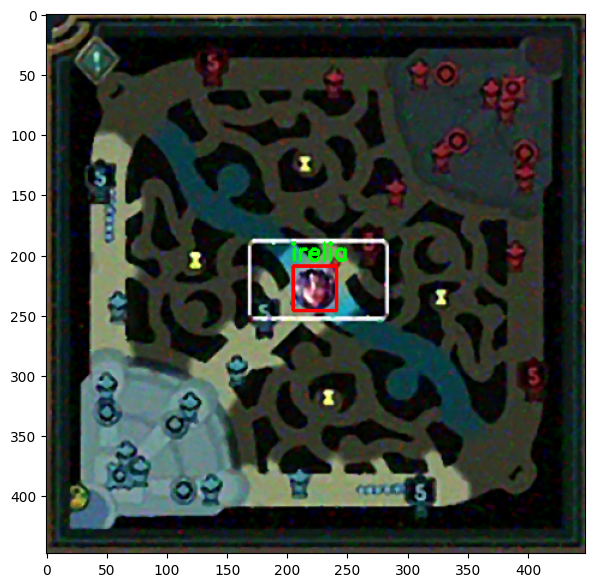

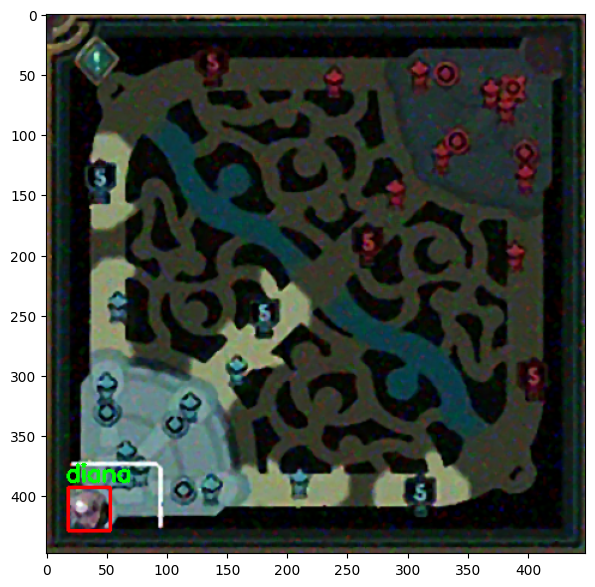

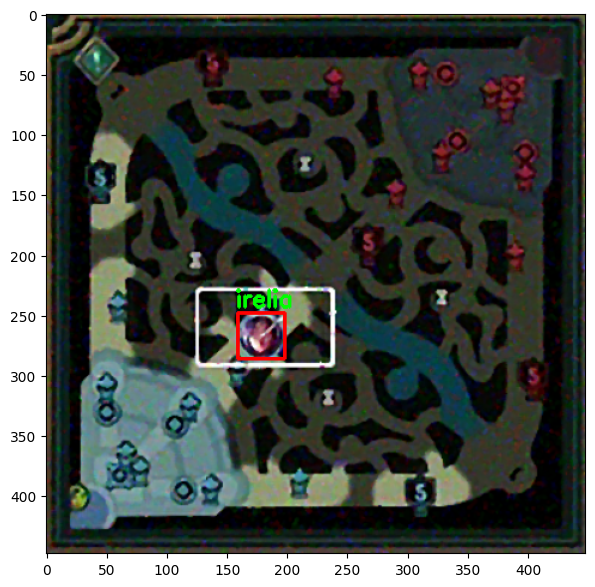

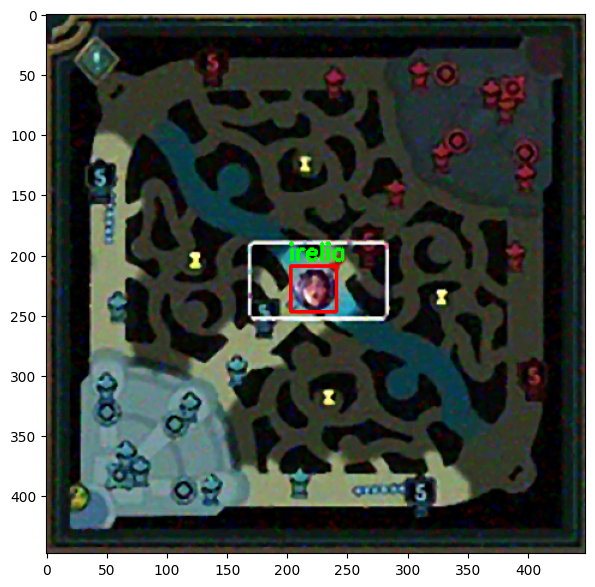

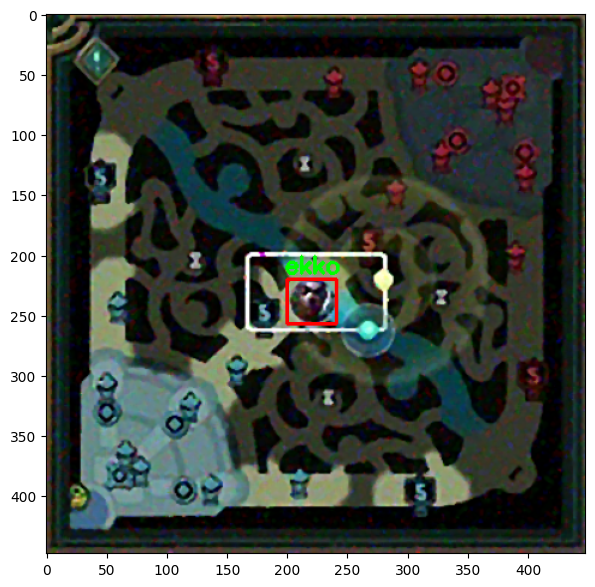

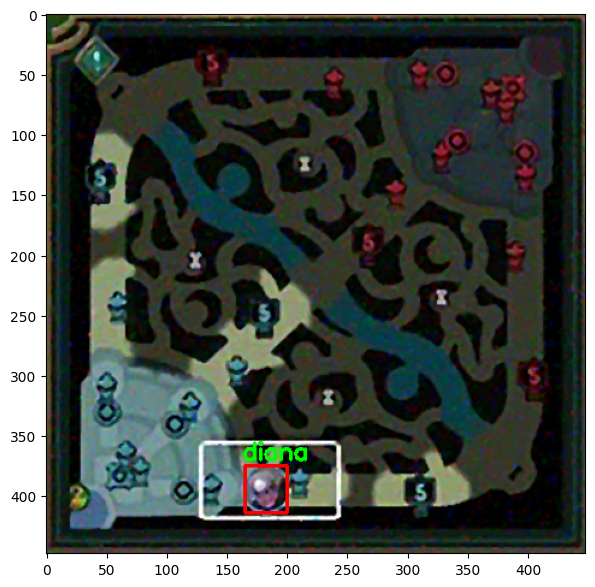

In [19]:
for i in range(10):
  visualize(images[i:],tensors[i:],1)

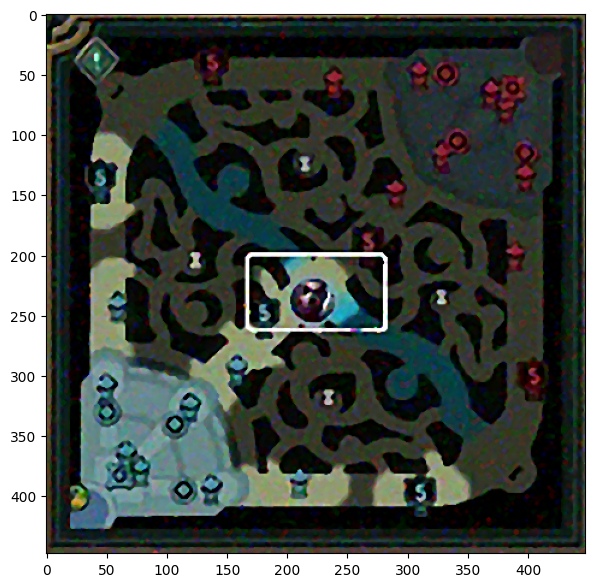

In [20]:
plt.figure(figsize=(7,7))
plt.imshow(blur(images[1]))

In [21]:
def avg_iou(y_true,y_pred):
  c = tf.reshape(y_true[:,:,:,0],[-1,49])
  x = tf.reshape(y_true[:,:,:,1],[-1,49])
  y = tf.reshape(y_true[:,:,:,2],[-1,49])
  w = tf.reshape(y_true[:,:,:,3],[-1,49])
  h = tf.reshape(y_true[:,:,:,4],[-1,49])
  

  x_hat = tf.reshape(y_pred[:,:,:,1],[-1,49]) 
  y_hat = tf.reshape(y_pred[:,:,:,2],[-1,49])
  w_hat = tf.reshape(y_pred[:,:,:,3],[-1,49])
  h_hat = tf.reshape(y_pred[:,:,:,4],[-1,49])
  

  x1 = tf.math.maximum(x-(w/2),x_hat-(w_hat/2))
  y1 = tf.math.maximum(y-(h/2),y_hat-(h_hat/2))
  x2 = tf.math.minimum(x+(w/2),x_hat+(w_hat/2))
  y2 = tf.math.minimum(y+(h/2),y_hat+(h_hat/2))

  intersection = tf.math.maximum(0.,x2-x1) * tf.math.maximum(0.,y2-y1)
  area_truth = ( (x+(w/2)) - (x-(w/2)) ) * ( (y+(h/2)) - (y-(h/2)) )
  area_pred = ( (x_hat+(w_hat/2)) - (x_hat-(w_hat/2)) ) * ( (y_hat+(h_hat/2)) - (y_hat-(h_hat/2)) )
  union = (area_truth+area_pred-intersection)+1e-10
  iou = intersection/union

  return tf.reduce_mean(tf.reduce_sum(iou*c,axis=-1))

In [22]:
images,labels = next(batch_generator(batch_size,train_image_files,train_label_files))
avg_iou(labels,labels)

<tf.Tensor: shape=(), dtype=float32, numpy=1.0>

# **Loss Functions**

---


In [23]:
def yolo_loss_batch(batch_size):
  def yolo_loss(y_true,y_pred):
    c = tf.reshape(y_true[:,:,:,0],[-1,49])
    x = tf.reshape(y_true[:,:,:,1],[-1,49])
    y = tf.reshape(y_true[:,:,:,2],[-1,49])
    w = tf.reshape(y_true[:,:,:,3],[-1,49])
    h = tf.reshape(y_true[:,:,:,4],[-1,49])
    classes = tf.reshape(y_true[:,:,:,5:],[-1,49,10])

    c_hat = tf.reshape(y_pred[:,:,:,0],[-1,49])
    x_hat = tf.reshape(y_pred[:,:,:,1],[-1,49]) 
    y_hat = tf.reshape(y_pred[:,:,:,2],[-1,49])
    w_hat = tf.reshape(y_pred[:,:,:,3],[-1,49])
    h_hat = tf.reshape(y_pred[:,:,:,4],[-1,49])
    classes_hat = tf.reshape(y_pred[:,:,:,5:],[-1,49,10])
    
    x1 = tf.math.maximum(x-(w/2),x_hat-(w_hat/2))
          
    y1 = tf.math.maximum(y-(h/2),y_hat-(h_hat/2))

    x2 = tf.math.minimum(x+(w/2),x_hat+(w_hat/2))
          
    y2 = tf.math.minimum(y+(h/2),y_hat+(h_hat/2))

    intersection = tf.math.maximum(0.,x2-x1) * tf.math.maximum(0.,y2-y1)
    area_truth = ( (x+(w/2)) - (x-(w/2)) ) * ( (y+(h/2)) - (y-(h/2)) )
    area_pred = ( (x_hat+(w_hat/2)) - (x_hat-(w_hat/2)) ) * ( (y_hat+(h_hat/2)) - (y_hat-(h_hat/2)) )
    union = (area_truth+area_pred-intersection)+1e-10
    iou = intersection/union

    detection_loss = tf.math.reduce_sum(tf.keras.losses.binary_crossentropy(c,c_hat))

    iou_loss =tf.math.reduce_sum(((1-iou)**2)*c) #tf.math.reduce_sum(tf.keras.losses.binary_crossentropy(c,iou*c+1e-10))

    classification_loss = tf.math.reduce_sum(\
                          tf.keras.losses.binary_crossentropy(classes,
                          classes_hat*tf.expand_dims(c,axis=-1)))
    
    loss = detection_loss+iou_loss#+classification_loss
    
    # print("iou contributes {0}".format((iou_loss/loss)*100))
    # print("detection contributes {0}".format((detection_loss/loss)*100))
    # print("class contributes {0}".format((classification_loss/loss)*100))

    mean_loss = loss/batch_size
    return mean_loss
  return yolo_loss

In [24]:
def classification_accuracy(y_true, y_pred):
    # get location of high accuracy
    class_preds = tf.expand_dims(tf.reduce_sum(tf.argmax(y_pred, axis=-1),axis=-1),axis=-1)
    true_preds = tf.expand_dims(tf.reduce_sum(tf.argmax(y_true, axis=-1),axis=-1),axis=-1)
    accuracy = tf.reduce_sum(tf.cast(tf.equal(class_preds,true_preds),tf.int32))/batch_size

    return tf.reduce_sum(tf.keras.losses.mse(y_true,y_pred))

**Testing Loss Functions**

---



In [25]:
model = yolo()
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

In [26]:
images,labels = next(batch_generator(batch_size,train_image_files,train_label_files))
prediction = model.predict(images)

1/1 [==============================] - 9s 9s/step


In [27]:
print(labels.shape)
print(prediction.shape)

(16, 7, 7, 15)
(16, 7, 7, 15)


In [28]:
l = yolo_loss_batch(batch_size)
l(labels,prediction)

<tf.Tensor: shape=(), dtype=float32, numpy=1.6623344>

In [29]:
logits = tf.reshape(prediction,[-1,49,15]) 
y = tf.reshape(labels,[-1,49,15])
classification_accuracy(y[:,:,5:],logits[:,:,5:]*tf.expand_dims(y[:,:,0],axis=-1))

<tf.Tensor: shape=(), dtype=float32, numpy=1.5935361>

# **Training Model**

---



In [30]:
def apply_gradient(optimizer, loss_object, model, x, y):
    
    with tf.GradientTape() as tape:
        y_pred = model(x)
        loss_value = loss_object(y,y_pred)
    
    gradients = tape.gradient(loss_value,model.trainable_variables)
    optimizer.apply_gradients(zip(gradients,model.trainable_variables))
  
    return loss_value

In [31]:
def train_data_for_one_epoch(train_dataset,batch_size, optimizer,x,y,loss_object, model):
  losses = []
  for x_batch_train, y_batch_train in train_dataset(batch_size,x,y):
    loss_value = apply_gradient(optimizer, loss_object, model, x_batch_train, y_batch_train)
    losses.append(loss_value)
  return losses

In [32]:
def vgg():
  vgg16_model = tf.keras.applications.VGG16(include_top=False,weights=None,input_shape=(448,448,3))
  model = tf.keras.models.Sequential()
  for layer in vgg16_model.layers[:-1]:
    model.add(layer)

  model.add(Conv2D(256,(3,3),activation="relu",padding="same"))
  model.add(MaxPooling2D())
  
  model.add(Conv2D(15,(3,3),activation="sigmoid",padding="same"))
  model.add(MaxPooling2D())

  return model

In [33]:
model = vgg()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 448, 448, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 448, 448, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 224, 224, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 224, 224, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 224, 224, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 112, 112, 128)     0         
                                                                 
 block3_conv1 (Conv2D)       (None, 112, 112, 256)     2

  0%|          | 0/40 [00:00<?, ?it/s]

2/2 [==============================] - 15s 31ms/step
test avg iou is 0.23887546360492706
Epoch 0, Train loss 1.4900000095367432


2/2 [==============================] - 1s 498ms/step
test avg iou is 0.3089045286178589
Epoch 1, Train loss 0.8100000023841858


2/2 [==============================] - 1s 511ms/step
test avg iou is 0.40670615434646606
Epoch 2, Train loss 0.75


2/2 [==============================] - 1s 523ms/step
test avg iou is 0.3743476867675781
Epoch 3, Train loss 0.7099999785423279


2/2 [==============================] - 1s 530ms/step
test avg iou is 0.42810365557670593
Epoch 4, Train loss 0.699999988079071


2/2 [==============================] - 1s 533ms/step
test avg iou is 0.341222882270813
Epoch 5, Train loss 0.6899999976158142


2/2 [==============================] - 1s 530ms/step
test avg iou is 0.4569903612136841
Epoch 6, Train loss 0.6700000166893005


2/2 [==============================] - 1s 531ms/step
test avg iou is 0.337929368019104
Epoch 7, Train loss 0.6

test avg iou is 0.5133724212646484
Epoch 38, Train loss 0.4300000071525574


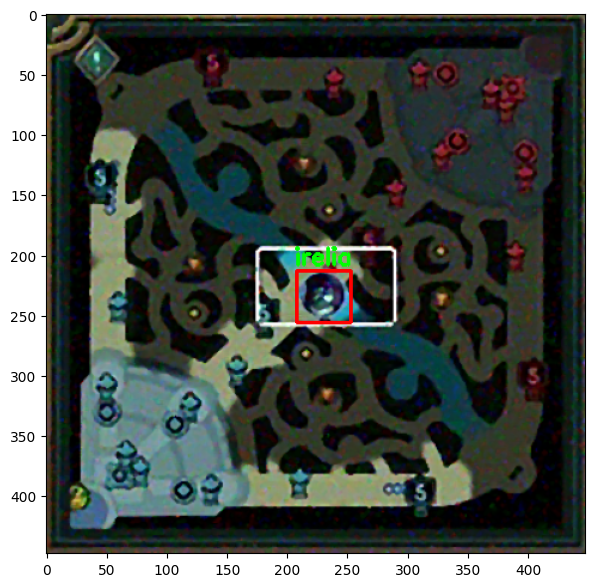

In [ ]:
tf.keras.backend.clear_session()
tf.random.set_seed(-1)
#-1
model = vgg()
optimizer = tf.keras.optimizers.Adam(learning_rate=0.00001)
loss_func = yolo_loss_batch(batch_size)
epochs_train_losses = []

for epoch in tqdm(range(epochs)):
    losses_train = train_data_for_one_epoch(batch_generator,batch_size,optimizer,train_image_files,train_label_files,loss_func, model)
    
    losses_train_mean = np.mean(losses_train)
    epochs_train_losses.append(losses_train_mean)
    
    x,y = next(batch_generator(64,test_image_files,test_label_files))
    logits = model.predict(x)
    iou = avg_iou(y,logits)

    logits = tf.reshape(logits,[-1,49,15]) 
    y = tf.reshape(y,[-1,49,15])
    acc = classification_accuracy(y[:,:,5:],logits[:,:,5:]*tf.expand_dims(y[:,:,0],axis=-1))
  
    # print(f"test classification mse is {acc}")
    print(f"test avg iou is {iou}")
    print('Epoch {0}, Train loss {1}'.format((epoch),round(losses_train_mean,2)))

    logits = np.reshape(logits,[-1,7,7,15]) 
    visualize(x,logits,iou)
    print("\n")

# **Model Prediction**

---

In [45]:
imgs,labels = next(batch_generator(len(test_image_files)//8,test_image_files,test_label_files))

In [46]:
print(imgs.shape)

(810, 448, 448, 3)


1/1 [==============================] - 0s 57ms/step


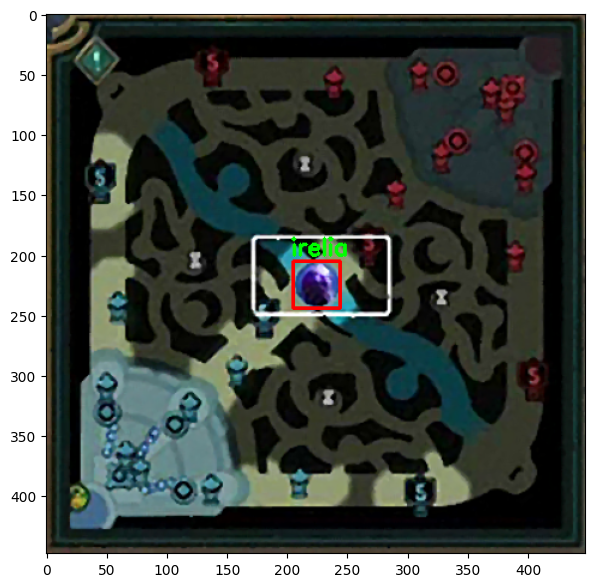

1/1 [==============================] - 0s 30ms/step


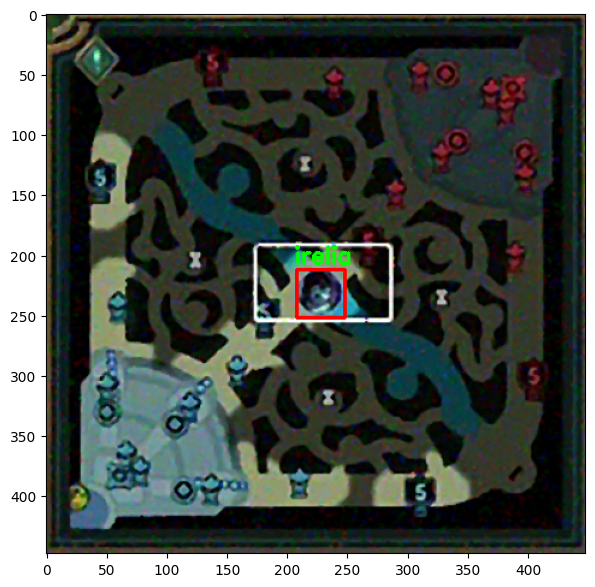

1/1 [==============================] - 0s 36ms/step


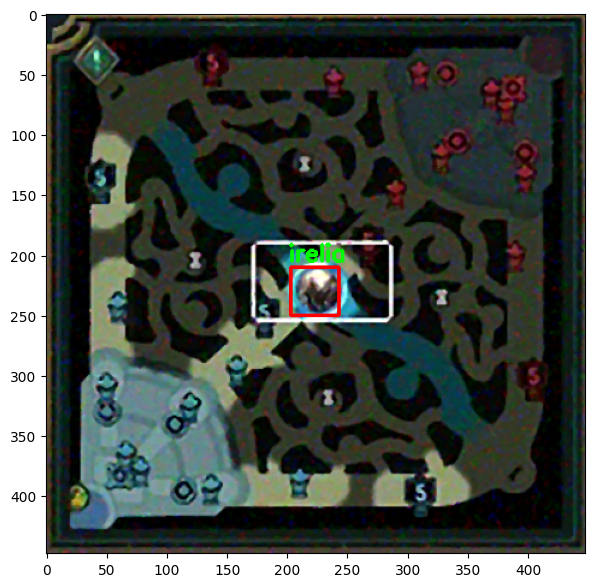

1/1 [==============================] - 0s 76ms/step


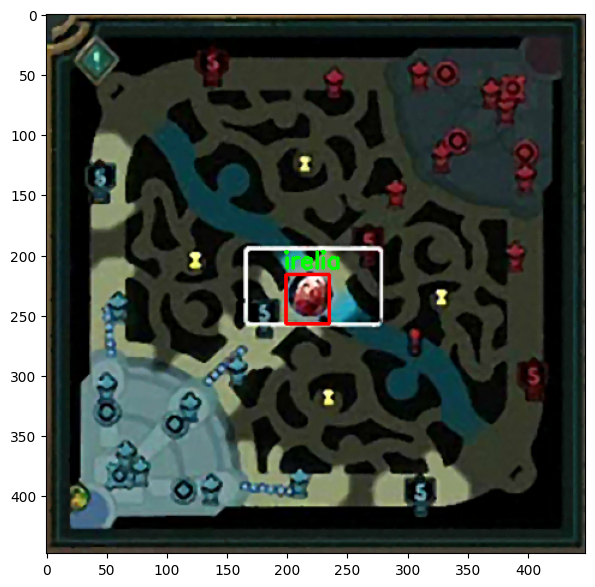

1/1 [==============================] - 0s 64ms/step


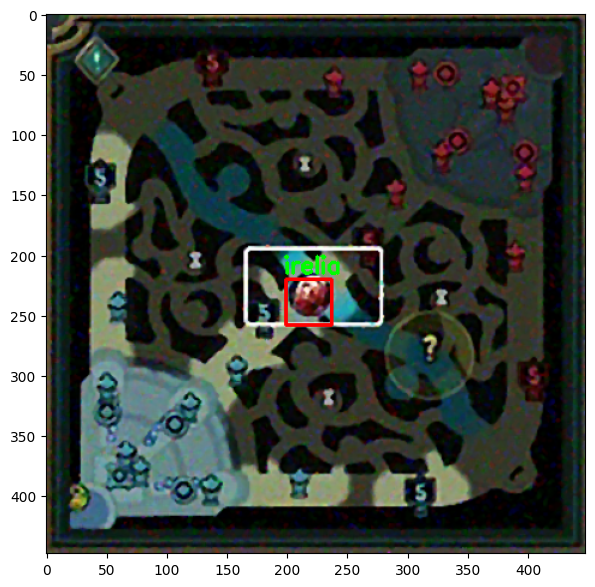

1/1 [==============================] - 0s 42ms/step


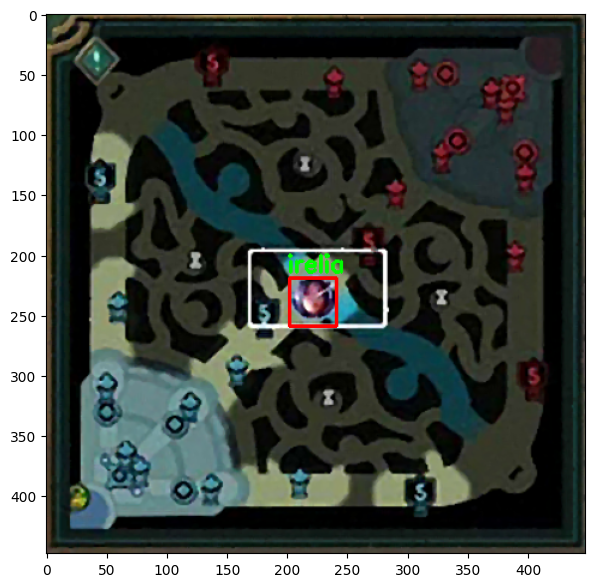

1/1 [==============================] - 0s 82ms/step


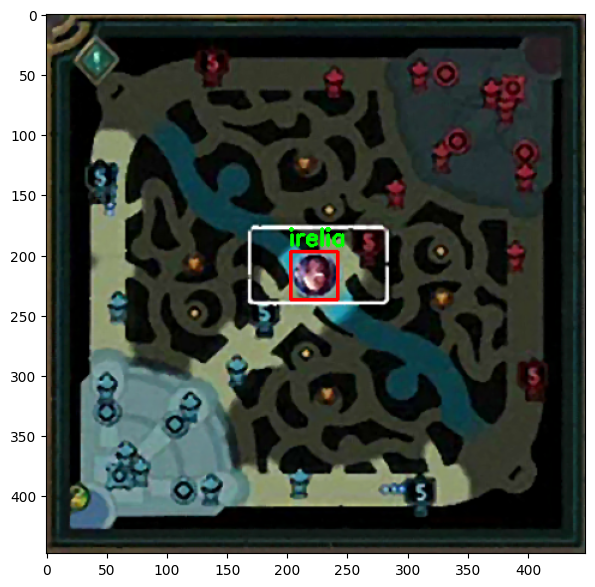

1/1 [==============================] - 0s 117ms/step


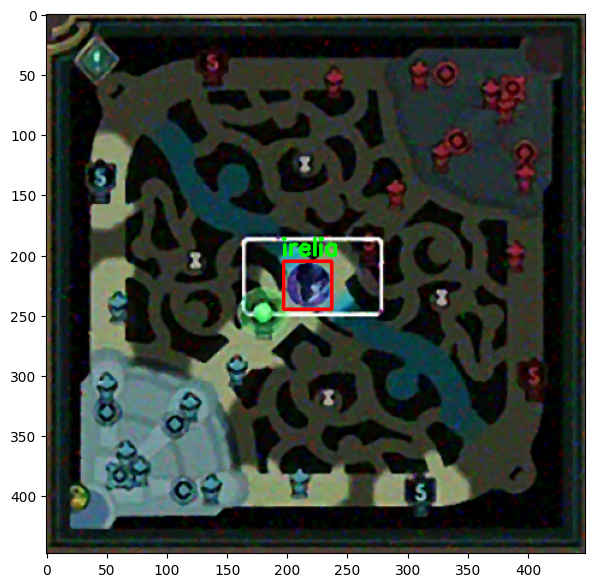

1/1 [==============================] - 0s 28ms/step


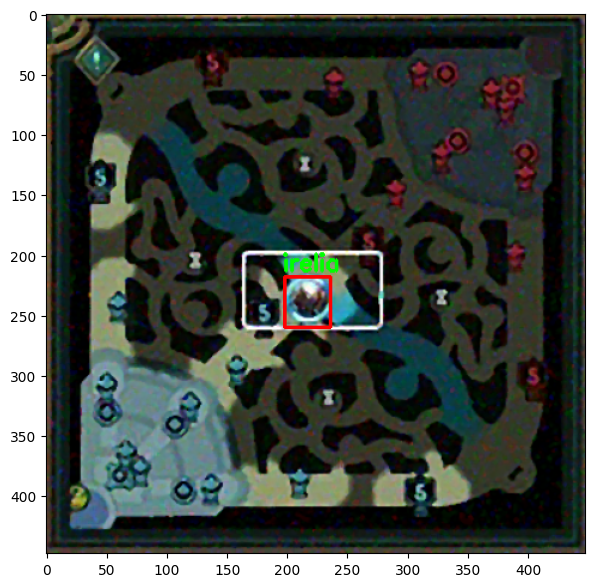

1/1 [==============================] - 0s 47ms/step


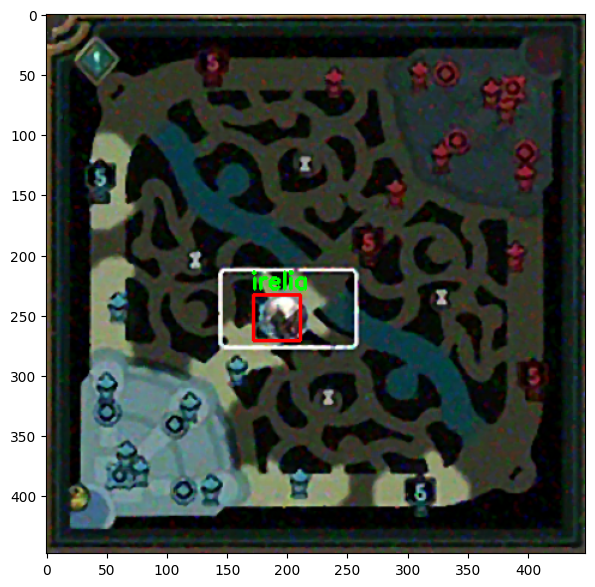

1/1 [==============================] - 0s 54ms/step


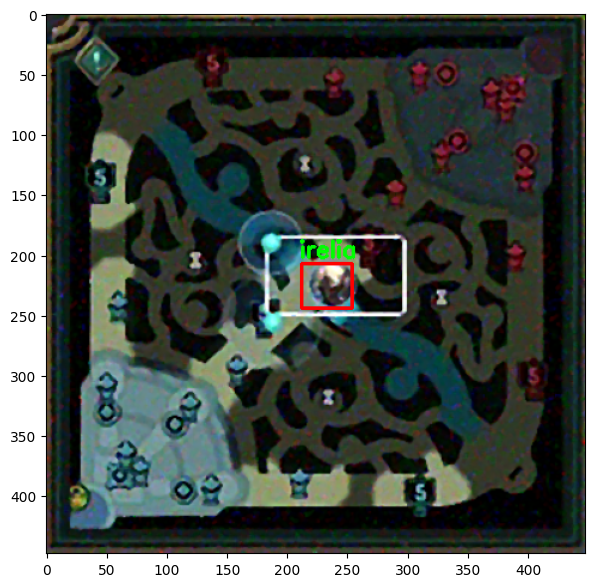

1/1 [==============================] - 0s 28ms/step


In [48]:
font = cv2.FONT_HERSHEY_SIMPLEX
for k in range(50,100):
  f_map = model.predict(np.expand_dims(imgs[k],axis=0))
  fmap = f_map.reshape((-1,49,15))
  for i in range(fmap[0].shape[0]):
    c_hat = fmap[0,i,0] # (B,49)
    x_hat = fmap[0,i,1] 
    y_hat = fmap[0,i,2]
    w_hat = fmap[0,i,3]
    h_hat = fmap[0,i,4]
    index = np.argmax(fmap[0,i,5:])
    if c_hat>=0.5:
      p1 = ( int((x_hat-(w_hat/2))*448),int((y_hat-(h_hat/2))*448))
      p2 = ( int((x_hat+(w_hat/2))*448),int((y_hat+(h_hat/2))*448))

      im = cv2.rectangle(imgs[k].numpy().copy(),p1,p2,(255,0,0),2)
      im = cv2.putText(im, str(champions[index]), (p1[0]-2,p1[1]-5), font, 
                   0.65, (0, 1, 0),2, cv2.LINE_AA)
      
      plt.figure(figsize=(7,7))
      plt.imshow(im)
      plt.show()

In [ ]:
# os.path.join(os.getcwd(),"mid.names")
# !cat /content/mid.names
    # positive_class_weights = np.sum(classes,axis=(0,1))/classes.shape[0] ### weights should be w.r.t
    # negative_class_weights = (1-positive_class_weights)                  ## classes size not batchsize

    # print(-np.sum(negative_class_weights*classes*tf.expand_dims(c,axis=-1)*np.log(classes_hat)))
    # print(-np.sum(positive_class_weights*(1-classes)*tf.expand_dims(c,axis=-1)*np.log(1-classes_hat)))

    # negative_detection_weights = c.shape[0]*((c.shape[1]-1)/c.shape[1])
    # positive_detection_weights = c.shape[0]*(1/c.shape[1])
    
    # print(-np.sum(negative_detection_weights*c*np.log(c_hat)))
    # print(-np.sum(positive_detection_weights*(1-c)*np.log(1-c_hat)))

In [ ]:
# _, axes = plt.subplots(4, 5)
# for r,row in enumerate(axes):
#   for c,column in enumerate(row):
#     c_image = (images[r*c*30].copy().astype("float32")*255).astype("int32")
#     xmid,ymid,width,height = labels[r*c*30,1:5].copy()
#     pt1 = (int((xmid-(width/2))*448),int((ymid-(height/2))*448))
#     pt2 = (int((xmid+(width/2))*448),int((ymid+(height/2))*448))
#     cv2.rectangle(c_image,pt1,pt2,(255,0,0),1)
#     plt.figure(figsize=(10,10))
#     column.imshow(c_image)